In [1]:
from bs4 import BeautifulSoup as bs
import requests
import pandas as pd
import docx
import pdfkit
import io
import types
from tqdm.auto import tqdm, trange

## 1.1 Парсинг данных

In [2]:
result_list = {'title': [], 'namecompany': [], 'description': [], 'rating': [], 'field': [], 'date': [], 'text': []}

In [3]:
content = docx.Document('conditates.docx').paragraphs

In [4]:
companies = []
for i in range(len(content)):
    companies.append(content[i].text)
companies

['OTUS',
 'Timeweb Cloud',
 'VK',
 'RUVDS.com',
 'Southbridge',
 'Selectel',
 'Brave',
 'X5 Tech',
 'Сбер',
 'HOSTKEY',
 'ДОМ.РФ']

In [5]:
pagenum = 1 #переменная для счета страниц
for i in range(10):
    url = 'https://habr.com/ru/all/page' + str(pagenum) + '/' # переход на ссылку с определенным номером страницы
    page = requests.get(url)
    soup = bs(page.text, 'html.parser')
    pages = soup.find_all('h2', class_= 'tm-title tm-title_h2') # получение заголовков статей
    for j in pages: #перебор статей
        fieldtext = "" #отрасли компании
        texttt = ""
        url = 'https://habr.com' + str(j.a.get('href')) #переход на страницу статьи
        page = requests.get(url)
        soup = bs(page.text, 'html.parser')
        name_company = soup.find('a', class_= 'tm-company-snippet__title') #получаем название компании
        desc_company = soup.find('div', class_='tm-company-snippet__description') #описание компании
        if(name_company is not None and name_company.text in companies): #если на странице статьи присутствует название компании
            result_list['title'].append(j.text) #заполняем словарь названием статьи
            result_list['namecompany'].append(name_company.text)#заполняем словарь названием компании
            result_list['description'].append(desc_company.text)#заполняем словарь описанием компании
            textarticle = soup.find('div', class_='tm-article-body')
            texts = textarticle.find_all('p')
            
            for i in range(len(texts)):
                texttt = texttt + (texts[i].text)
            result_list['text'].append(texttt)
            datepub = soup.find('span', class_= 'tm-article-datetime-published')#получаем дату публикации
            result_list['date'].append(datepub.time['datetime'])#записываем дату публикации в словарь
            url = 'https://habr.com' + str(name_company.get('href'))#переходим на страницу компании
            page = requests.get(url)
            soup = bs(page.text, 'html.parser')
            #получаем рейтинг компании
            rating = soup.find('span', class_='tm-votes-lever__score-counter tm-votes-lever__score-counter tm-votes-lever__score-counter_rating')
            if(rating is None): #если рейтинг отсутствует то добавляем в словарь 0
                result_list['rating'].append('0')
            else:
                result_list['rating'].append((rating.text).strip())
            field = soup.find_all('a', class_='tm-company-profile__categories-text') #получаем список отраслей компании
            for fields in field:
                fieldtext = fieldtext + ((fields.text).strip()) + " "
            fieldtext = fieldtext.splitlines()
            result_list['field'].append(''.join(str(e) for e in fieldtext))# добавляем отрасли в словарь
    pagenum = pagenum + 1 # прибавляем страницу
    print(result_list)

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество'], 'namecompany': ['OTUS', 'Selectel', 'RUVDS.com'], 'description': ['Цифровые навыки от ведущих экспертов', 'IT-инфраструктура для бизнеса', 'VDS/VPS-хостинг. Скидка 15% по коду HABR15'], 'rating': ['900.65', '1910.29', '2430.98'], 'field': ['Консалтинг и поддержка Рекрутинг и HR Производство мультимедиа-контента ', 'Аппаратное обеспечение Связь и телекоммуникации Домены и хостинг ', 'Связь и телекоммуникации Домены и хостинг Веб-сервисы '], 'date': ['2023-04-12T11:21:01.000Z', '2023-04-12T11:09:24.000Z', '2023-04-12T09:00:01.000Z'], 'text': ['Резюме: Принципы SOLID — это руководство по написанию хорошего объектно-ориентированного кода. Оказалось, что эти принципы соблюдаются и воплощаются в Clojure.Роберт К. Мартин (Robert C. Martin) (дядя Боб) назвал пять основных принципов проектирования программ

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы'], 'namecompany': ['OTUS', 'Selectel', 'RUVDS.com', 'Timeweb Cloud', 'RUVDS.com', 'Selectel'], 'description': ['Цифровые навыки от ведущих экспертов', 'IT-инфраструктура для бизнеса', 'VDS/VPS-хостинг. Скидка 15% по коду HABR15', 'Облачная платформа для разработчиков и бизнеса', 'VDS/VPS-хостинг. Скидка 15% по коду HABR15', 'IT-инфраструктура для бизнеса'], 'rating': ['900.65', '1910.29', '2430.98', '1995.55', '2430.98', '1910.29'], 'field': ['Консалтинг и поддержка Рекрутинг и HR Производство мультимедиа-контента ', 'Аппаратное обеспечение Связь и телекоммуникации Домены и хостинг ', 'Связ

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka'], 'namecompany': ['OTUS', 'Selectel', 'RUVDS.com', 'Timeweb Cloud', 'RUVDS.com', 'Selectel', 'OTUS', 'Southbridge', 'OTUS'], 'description': ['Цифровые навыки от ведущих экспертов', 'IT-инфраструктура для бизнеса', 'VDS/VPS-хостинг. Скидка 15% по коду HABR15', 'Облачная платформа для разработчиков и бизнеса', 'VDS/VPS-хостинг. Скидка 15% по коду HABR15', 'IT-инфраструктура для бизнеса', 'Цифровые навыки от ведущих экспертов', 'Обеспечиваем стабильну

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде'], 'namecompany': ['OTUS', 'Selectel', 'RUVDS.com', 'Timeweb Cloud', 'RUVDS.com', 'Selectel', 'OTUS', 'Southbridge', 'OTUS', 'OTUS', 'ДОМ.РФ', 'RUVDS.com', 'Select

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде', 'О снижении затрат на PostgreSQL в облаке', 'Нестабильный Wi-Fi? MikroTik покупай, частоту на нём автоматом меняй'], 'namecompany': ['OTUS', 'Selectel', 'RUVDS.c

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде', 'О снижении затрат на PostgreSQL в облаке', 'Нестабильный Wi-Fi? MikroTik покупай, частоту на нём автоматом меняй', 'Разработка BIOS на языках высокого уровня', 

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде', 'О снижении затрат на PostgreSQL в облаке', 'Нестабильный Wi-Fi? MikroTik покупай, частоту на нём автоматом меняй', 'Разработка BIOS на языках высокого уровня', 

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде', 'О снижении затрат на PostgreSQL в облаке', 'Нестабильный Wi-Fi? MikroTik покупай, частоту на нём автоматом меняй', 'Разработка BIOS на языках высокого уровня', 

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде', 'О снижении затрат на PostgreSQL в облаке', 'Нестабильный Wi-Fi? MikroTik покупай, частоту на нём автоматом меняй', 'Разработка BIOS на языках высокого уровня', 

{'title': ['Принципы SOLID в Clojure', 'Как улучшать продукты, опираясь на мнение пользователей, или загадка плавающего IP-адреса', 'Домашний сервер нагревает воду и экономит электричество', 'Кто продаёт спутниковые фотографии и сколько они стоят', 'Будущее игровой индустрии. На распутье', '6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что способен «ноутбук» от Mediaworkstations и другие подобные системы', 'Настраиваем визуализацию', 'Prometheus + Grafana: 4 golden signals и другие подходы к мониторингу', 'Обеспечение безопасности в Apache Kafka', 'Основы операционных систем', 'Как мы оценили удовлетворенность бизнес-заказчика через\xa0анализ ТГ-чатов', 'Отменить нельзя продолжить', '«Коммутаторы — это коробки, а клиенты — котики». Как устроены выделенные сетевые инсталляции', '10 soft skills, которые необходимы каждой IT-команде', 'О снижении затрат на PostgreSQL в облаке', 'Нестабильный Wi-Fi? MikroTik покупай, частоту на нём автоматом меняй', 'Разработка BIOS на языках высокого уровня', 

In [6]:
FILE_NAME = "dataset.csv"
df = pd.DataFrame(data=result_list)
df.to_csv(FILE_NAME)

In [7]:
df = pd.read_csv("dataset.csv")

In [8]:
df.head()

,Unnamed: 0,title,namecompany,description,rating,field,date,text
0,0,Принципы SOLID в Clojure,OTUS,Цифровые навыки от ведущих экспертов,900.65,Консалтинг и поддержка Рекрутинг и HR Производ...,2023-04-12T11:21:01.000Z,Резюме: Принципы SOLID — это руководство по на...
1,1,"Как улучшать продукты, опираясь на мнение поль...",Selectel,IT-инфраструктура для бизнеса,1910.29,Аппаратное обеспечение Связь и телекоммуникаци...,2023-04-12T11:09:24.000Z,NaN
2,2,Домашний сервер нагревает воду и экономит элек...,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2430.98,Связь и телекоммуникации Домены и хостинг Веб-...,2023-04-12T09:00:01.000Z,NaN
3,3,Кто продаёт спутниковые фотографии и сколько о...,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1995.55,Веб-разработка Домены и хостинг Веб-сервисы,2023-04-12T08:05:06.000Z,NaN
4,4,Будущее игровой индустрии. На распутье,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2430.98,Связь и телекоммуникации Домены и хостинг Веб-...,2023-04-12T03:45:01.000Z,В юном возрасте в игры играешь много и взахлёб...


In [9]:
#b = True
#while b == True:
    #k = 0
    #for i in range(len(result_list['namecompany'])):
        #if(result_list['text'][i] == ''):
            #result_list['text'].remove(result_list['text'][i])
            #result_list['namecompany'].remove(result_list['namecompany'][i])
            #result_list['description'].remove(result_list['description'][i])
            #result_list['field'].remove(result_list['field'][i])
            #result_list['date'].remove(result_list['date'][i])
            #result_list['rating'].remove(result_list['rating'][i])
            #result_list['title'].remove(result_list['title'][i])
            #break
        #else:
            #k += 1
    #if k == len(result_list['namecompany']):
        #b = False

In [10]:
FILE_NAME = "dataset.csv"
df = pd.DataFrame(data=result_list)
df.to_csv(FILE_NAME)

In [11]:
df = pd.read_csv("dataset.csv")

In [12]:
df.head()

,Unnamed: 0,title,namecompany,description,rating,field,date,text
0,0,Принципы SOLID в Clojure,OTUS,Цифровые навыки от ведущих экспертов,900.65,Консалтинг и поддержка Рекрутинг и HR Производ...,2023-04-12T11:21:01.000Z,Резюме: Принципы SOLID — это руководство по на...
1,1,"Как улучшать продукты, опираясь на мнение поль...",Selectel,IT-инфраструктура для бизнеса,1910.29,Аппаратное обеспечение Связь и телекоммуникаци...,2023-04-12T11:09:24.000Z,NaN
2,2,Домашний сервер нагревает воду и экономит элек...,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2430.98,Связь и телекоммуникации Домены и хостинг Веб-...,2023-04-12T09:00:01.000Z,NaN
3,3,Кто продаёт спутниковые фотографии и сколько о...,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1995.55,Веб-разработка Домены и хостинг Веб-сервисы,2023-04-12T08:05:06.000Z,NaN
4,4,Будущее игровой индустрии. На распутье,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2430.98,Связь и телекоммуникации Домены и хостинг Веб-...,2023-04-12T03:45:01.000Z,В юном возрасте в игры играешь много и взахлёб...


### Описание данных

__title__ - Название заголовка статьи.

__namecompany__ - название компании.

__description__ - описание компании.

__field__ - сферы деятельности компаний.

__date__ - дата публикации статьи.

__text__ - текст статьи.

Получили исходный набор данных для дальнейшей работы.

## 1.2 Формирование структуры набора данных

In [13]:
df = df.drop(["Unnamed: 0"], axis=1)

In [14]:
df

,title,namecompany,description,rating,field,date,text
0,Принципы SOLID в Clojure,OTUS,Цифровые навыки от ведущих экспертов,900.65,Консалтинг и поддержка Рекрутинг и HR Производ...,2023-04-12T11:21:01.000Z,Резюме: Принципы SOLID — это руководство по на...
1,"Как улучшать продукты, опираясь на мнение поль...",Selectel,IT-инфраструктура для бизнеса,1910.29,Аппаратное обеспечение Связь и телекоммуникаци...,2023-04-12T11:09:24.000Z,NaN
2,Домашний сервер нагревает воду и экономит элек...,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2430.98,Связь и телекоммуникации Домены и хостинг Веб-...,2023-04-12T09:00:01.000Z,NaN
3,Кто продаёт спутниковые фотографии и сколько о...,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1995.55,Веб-разработка Домены и хостинг Веб-сервисы,2023-04-12T08:05:06.000Z,NaN
4,Будущее игровой индустрии. На распутье,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2430.98,Связь и телекоммуникации Домены и хостинг Веб-...,2023-04-12T03:45:01.000Z,В юном возрасте в игры играешь много и взахлёб...
5,"6 дисплеев, 192 ядра и 3 ТБ ОЗУ DDR5: на что с...",Selectel,IT-инфраструктура для бизнеса,1910.29,Аппаратное обеспечение Связь и телекоммуникаци...,2023-04-12T00:38:10.000Z,NaN
6,Настраиваем визуализацию,OTUS,Цифровые навыки от ведущих экспертов,900.65,Консалтинг и поддержка Рекрутинг и HR Производ...,2023-04-11T16:16:01.000Z,В предыдущей статье мы развернули связку Prome...
7,Prometheus + Grafana: 4 golden signals и други...,Southbridge,Обеспечиваем стабильную работу highload-проектов,252.17,Веб-разработка Консалтинг и поддержка Связь и ...,2023-04-11T15:45:54.000Z,"С мониторингом, как с кораблем. Конечно, успех..."
8,Обеспечение безопасности в Apache Kafka,OTUS,Цифровые навыки от ведущих экспертов,900.65,Консалтинг и поддержка Рекрутинг и HR Производ...,2023-04-11T15:06:09.000Z,В предыдущих статьях мы рассмотрели архитектур...
9,Основы операционных систем,OTUS,Цифровые навыки от ведущих экспертов,900.65,Консалтинг и поддержка Рекрутинг и HR Производ...,2023-04-11T13:37:53.000Z,Операционные системы присутствуют в жизни кажд...


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   title        33 non-null     object 
 1   namecompany  33 non-null     object 
 2   description  33 non-null     object 
 3   rating       33 non-null     float64
 4   field        33 non-null     object 
 5   date         33 non-null     object 
 6   text         21 non-null     object 
dtypes: float64(1), object(6)
memory usage: 1.9+ KB


Все аттрибуты, кроме рейтинга имют тип object, а рейтинг имеет тип float.

In [16]:
df.shape

(33, 7)

In [2]:
df = pd.read_csv("dataset2.csv")

In [3]:
df

,Unnamed: 0,namecompany,description,rating,activity,date_publish,text_article
0,0,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1572.77,"Веб-разработка, Домены и хостинг, Веб-сервисы",2023-03-27,В своём блоге я рассмотрел устройство и назнач...
1,1,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Роман КозловРуководитель курса B...
2,2,Онлайн Патент,Ваш личный патентный офис,220.74,"Консалтинг и поддержка, Веб-сервисы",2023-03-27,Рынок биологически активных добавок(БАД) с каж...
3,3,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Александр КолесниковВирусный ана...
4,4,VK,"Технологии, которые объединяют",568.63,"Мобильные технологии, Веб-сервисы, Игры и разв...",2023-03-27,"Всем привет! Меня зовут Артём Пузанков, я DevS..."
...,...,...,...,...,...,...,...
433,433,ua-hosting.company,Хостинг-провайдер: серверы в NL до 300 Гбит/с,215.86,"Аппаратное обеспечение, Связь и телекоммуникац...",2023-03-10,Нам всегда есть чему поучиться у природы. Мног...
434,434,Флант,"DevOps-as-a-Service, Kubernetes, обслуживание ...",240.40,"Программное обеспечение, Консалтинг и поддержк...",2023-03-10,Разработка приложений иногда достигает такого ...
435,435,Nixys,"DevOps, DevSecOps, MLOps — системный IT-интегр...",115.77,"Консалтинг и поддержка, Оптимизация, Веб-сервисы",2023-03-10,"Всем привет! Меня зовут Виктор, я DevOps‑инжен..."
436,436,2ГИС,Главные по городской навигации,110.62,"Программное обеспечение, Реклама и маркетинг, ...",2023-03-10,Наша команда работает над «лицом» 2gis.ru — We...


## 1.3 Предварительная обработка текстовых данных  

### Предобработка

In [4]:
import string
def remove_punctuation(text):
    return "".join([ch if ch not in string.punctuation else ' ' for ch in text])

def remove_numbers(text):
    return ''.join([i if not i.isdigit() else ' ' for i in text])

import re
def remove_multiple_spaces(text):
	return re.sub(r'\s+', ' ', text, flags=re.I)

from nltk.stem import *
from nltk.corpus import stopwords
from pymystem3 import Mystem
from string import punctuation
mystem = Mystem() 

russian_stopwords = stopwords.words("russian")
russian_stopwords.extend(['…', '«', '»', '...'])
def lemmatize_text(text):
    tokens = mystem.lemmatize(text.lower())
    tokens = [token for token in tokens if token not in russian_stopwords and token != " "]
    text = " ".join(tokens)
    return text

In [5]:
prep_text = [remove_multiple_spaces(remove_numbers(remove_punctuation(text.lower()))) for text in tqdm(df['text_article'])]

  0%|          | 0/438 [00:00<?, ?it/s]

In [6]:
len(prep_text)
prep_text[0]

'в своём блоге я рассмотрел устройство и назначение почти всех контроллеров norvi обойдены вниманием оказались только контроллеры линейки gsm имеющие соответствующие модули на своём борту как вы понимаете наличие gsm модуля является существенным дополнением и значительно расширяет возможности контроллера можно посылать и принимать информационные и управляющие sms можно организовать резервный независимый от вашей iot инфраструктуры канал связи и т д в этой статье я рассмотрю модель norvi gsm ae v которая кроме esp и gsm модуля содержит цифровые и аналоговые входы интерфейс rs и прочие возможности что делает этот контроллер интересным решением для создания ваших проектов по автоматизации ❯семейство norvi gsmконтроллеры линейки norvi gsm имеют в качестве ядра модуль esp wroom wi fi bluetooth мб eeprom и т д что позволяет решать довольно тяжёлые вычислительные задачи поддерживать беспроводную связь и полноценный веб интерфейс работать с шифрованием данных и т д большинство моделей контролл

In [7]:
df['text_prep'] = prep_text

In [8]:
df.head()

,Unnamed: 0,namecompany,description,rating,activity,date_publish,text_article,text_prep
0,0,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1572.77,"Веб-разработка, Домены и хостинг, Веб-сервисы",2023-03-27,В своём блоге я рассмотрел устройство и назнач...,в своём блоге я рассмотрел устройство и назнач...
1,1,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Роман КозловРуководитель курса B...,автор статьи роман козловруководитель курса bi...
2,2,Онлайн Патент,Ваш личный патентный офис,220.74,"Консалтинг и поддержка, Веб-сервисы",2023-03-27,Рынок биологически активных добавок(БАД) с каж...,рынок биологически активных добавок бад с кажд...
3,3,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Александр КолесниковВирусный ана...,автор статьи александр колесниковвирусный анал...
4,4,VK,"Технологии, которые объединяют",568.63,"Мобильные технологии, Веб-сервисы, Игры и разв...",2023-03-27,"Всем привет! Меня зовут Артём Пузанков, я DevS...",всем привет меня зовут артём пузанков я devsec...


### Стемминг

In [9]:
from nltk.stem.snowball import SnowballStemmer 
stemmer = SnowballStemmer("russian") 

In [10]:
russian_stopwords = stopwords.words("russian")
russian_stopwords.extend(['…', '«', '»', '...', 'т.д.', 'т', 'д', 'это'])

In [11]:
from nltk.tokenize import word_tokenize
text = df['text_prep'][0]
word_tokenize(text) 

['в',
 'своём',
 'блоге',
 'я',
 'рассмотрел',
 'устройство',
 'и',
 'назначение',
 'почти',
 'всех',
 'контроллеров',
 'norvi',
 'обойдены',
 'вниманием',
 'оказались',
 'только',
 'контроллеры',
 'линейки',
 'gsm',
 'имеющие',
 'соответствующие',
 'модули',
 'на',
 'своём',
 'борту',
 'как',
 'вы',
 'понимаете',
 'наличие',
 'gsm',
 'модуля',
 'является',
 'существенным',
 'дополнением',
 'и',
 'значительно',
 'расширяет',
 'возможности',
 'контроллера',
 'можно',
 'посылать',
 'и',
 'принимать',
 'информационные',
 'и',
 'управляющие',
 'sms',
 'можно',
 'организовать',
 'резервный',
 'независимый',
 'от',
 'вашей',
 'iot',
 'инфраструктуры',
 'канал',
 'связи',
 'и',
 'т',
 'д',
 'в',
 'этой',
 'статье',
 'я',
 'рассмотрю',
 'модель',
 'norvi',
 'gsm',
 'ae',
 'v',
 'которая',
 'кроме',
 'esp',
 'и',
 'gsm',
 'модуля',
 'содержит',
 'цифровые',
 'и',
 'аналоговые',
 'входы',
 'интерфейс',
 'rs',
 'и',
 'прочие',
 'возможности',
 'что',
 'делает',
 'этот',
 'контроллер',
 'интересны

In [12]:
from nltk import word_tokenize

stemmed_texts_list = []
for text in tqdm(df['text_prep']):
    tokens = word_tokenize(text)    
    stemmed_tokens = [stemmer.stem(token) for token in tokens if token not in russian_stopwords]
    text = " ".join(stemmed_tokens)
    stemmed_texts_list.append(text)

df['text_stem'] = stemmed_texts_list


  0%|          | 0/438 [00:00<?, ?it/s]

In [13]:
def remove_stop_words(text):
    tokens = word_tokenize(text) 
    tokens = [token for token in tokens if token not in russian_stopwords and token != ' ']
    return " ".join(tokens)

In [14]:
from nltk import word_tokenize

sw_texts_list = []
for text in tqdm(df['text_prep']):
    tokens = word_tokenize(text)    
    tokens = [token for token in tokens if token not in russian_stopwords and token != ' ']
    text = " ".join(tokens)
    sw_texts_list.append(text)

df['text_sw'] = sw_texts_list

  0%|          | 0/438 [00:00<?, ?it/s]

In [15]:
df['text_sw'][0]

'своём блоге рассмотрел устройство назначение контроллеров norvi обойдены вниманием оказались контроллеры линейки gsm имеющие соответствующие модули своём борту понимаете наличие gsm модуля является существенным дополнением значительно расширяет возможности контроллера посылать принимать информационные управляющие sms организовать резервный независимый вашей iot инфраструктуры канал связи статье рассмотрю модель norvi gsm ae v которая кроме esp gsm модуля содержит цифровые аналоговые входы интерфейс rs прочие возможности делает контроллер интересным решением создания ваших проектов автоматизации ❯семейство norvi gsmконтроллеры линейки norvi gsm имеют качестве ядра модуль esp wroom wi fi bluetooth мб eeprom позволяет решать довольно тяжёлые вычислительные задачи поддерживать беспроводную связь полноценный веб интерфейс работать шифрованием данных большинство моделей контроллеров линейки имеют gsm модуль дисплей кнопки управления передней панели корпуса межблочный интерфейс цифровые опто

In [16]:
df['text_stem'][0]

'сво блог рассмотрел устройств назначен контроллер norvi обойд вниман оказа контроллер линейк gsm имеющ соответств модул сво борт понима налич gsm модул явля существен дополнен значительн расширя возможн контроллер посыла принима информацион управля sms организова резервн независим ваш iot инфраструктур кана связ стат рассмотр модел norvi gsm ae v котор кром esp gsm модул содерж цифров аналогов вход интерфейс rs проч возможн дела контроллер интересн решен создан ваш проект автоматизац ❯семейств norvi гсмконтроллер линейк norvi gsm имеют качеств ядр модул esp wroom wi fi bluetooth мб eeprom позволя реша довольн тяжел вычислительн задач поддержива беспроводн связ полноцен веб интерфейс работа шифрован дан большинств модел контроллер линейк имеют gsm модул диспл кнопк управлен передн панел корпус межблочн интерфейс цифров опторазвяза вход di остальн характеристик отлича состав представлен след таблиц модел ae v имеющ мо распоряжен выдел сер фон мо распоряжен имеет начальн довольн функцион

### Лемматизация

In [17]:
lemm_texts_list = []
for text in tqdm(df['text_sw']):
    #print(text)
    try:
        text_lem = mystem.lemmatize(text)
        tokens = [token for token in text_lem if token != ' ' and token not in russian_stopwords]
        text = " ".join(tokens)
        lemm_texts_list.append(text)
    except Exception as e:
        print(e)
    
df['text_lemm'] = lemm_texts_list

  0%|          | 0/438 [00:00<?, ?it/s]

In [18]:
def lemmatize_text(text):
    text_lem = mystem.lemmatize(text)
    tokens = [token for token in text_lem if token != ' ']
    return " ".join(tokens)

In [19]:
df.head()

,Unnamed: 0,namecompany,description,rating,activity,date_publish,text_article,text_prep,text_stem,text_sw,text_lemm
0,0,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1572.77,"Веб-разработка, Домены и хостинг, Веб-сервисы",2023-03-27,В своём блоге я рассмотрел устройство и назнач...,в своём блоге я рассмотрел устройство и назнач...,сво блог рассмотрел устройств назначен контрол...,своём блоге рассмотрел устройство назначение к...,свой блог рассматривать устройство назначение ...
1,1,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Роман КозловРуководитель курса B...,автор статьи роман козловруководитель курса bi...,автор стат рома козловруководител курс bi анал...,автор статьи роман козловруководитель курса bi...,автор статья роман козловруководитель курс bi ...
2,2,Онлайн Патент,Ваш личный патентный офис,220.74,"Консалтинг и поддержка, Веб-сервисы",2023-03-27,Рынок биологически активных добавок(БАД) с каж...,рынок биологически активных добавок бад с кажд...,рынок биологическ активн добавок бад кажд год ...,рынок биологически активных добавок бад каждым...,рынок биологически активный добавка бад каждый...
3,3,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Александр КолесниковВирусный ана...,автор статьи александр колесниковвирусный анал...,автор стат александр колесниковвирусн аналитик...,автор статьи александр колесниковвирусный анал...,автор статья александр колесниковвирусный анал...
4,4,VK,"Технологии, которые объединяют",568.63,"Мобильные технологии, Веб-сервисы, Игры и разв...",2023-03-27,"Всем привет! Меня зовут Артём Пузанков, я DevS...",всем привет меня зовут артём пузанков я devsec...,всем привет зовут арт пузанк devsecops инженер...,всем привет зовут артём пузанков devsecops инж...,привет звать артем пузанок devsecops инженер д...


In [20]:
df['text_lemm'][0]

'свой блог рассматривать устройство назначение контроллер norvi обходить внимание оказываться контроллер линейка gsm иметь соответствующий модуль свой борт понимать наличие gsm модуль являться существенный дополнение значительно расширять возможность контроллер посылать принимать информационный управляющий sms организовывать резервный независимый ваш iot инфраструктура канал связь статья рассматривать модель norvi gsm ae v который кроме esp gsm модуль содержать цифровой аналоговый вход интерфейс rs прочий возможность делать контроллер интересный решение создание ваш проект автоматизация  ❯ семейство norvi gsmконтроллеры линейка norvi gsm иметь качество ядро модуль esp wroom wi fi bluetooth мб eeprom позволять решать довольно тяжелый вычислительный задача поддерживать беспроводный связь полноценный веб интерфейс работать шифрование данный большинство модель контроллер линейка иметь gsm модуль дисплей кнопка управление передний панель корпус межблочный интерфейс цифровой опторазвязывать 

## 2.1 Поиск ключевых слов/n-грамм. Векторизация текстов

### Векторизация. Мешок слов

In [116]:
import pymorphy2
from nltk.corpus import stopwords
import nltk
morph = pymorphy2.MorphAnalyzer()

C:\anaconda\lib\site-packages\pymorphy2\units\base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
C:\anaconda\lib\site-packages\pymorphy2\units\base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
C:\anaconda\lib\site-packages\pymorphy2\units\base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
C:\anaconda\lib\site-packages\pymorphy2\units\base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
C:\anaconda\

In [117]:
def transform_data(data: pd.Series) -> list:
    result = [get_result(data=i) for i in data]
    return result

In [118]:
def preprocess_text(data, stopwords=stopwords.words("russian")):
    stopwords.extend(['либо', 'это', 'мб', 'далее', 'дв', 'свой', 'ваш','всё', 'очень', 'её', 'ещё', 'вообще', 'также', 'хотя', 'ия', 'чтовый', 'втом', 'м', 'го', 'вполне', 'ёмкость мач'])
    text = re.sub('ё','е', data.lower())
    text = re.sub(r"([.,!?])", r" \1 ",text)
    text = re.sub(r"[^а-яА-Я\s]+", "",text)
    text = text.strip()
    text = [w for w in text.split() if w not in stopwords] 
    text = [w for w in text if len(w) >=3]
    return ' '.join(text)

In [119]:
def lemmatization_text(data, morph=morph):
    result = ' '.join([morph.parse(x)[0].normal_form for x in data.split()])
    return result

In [120]:
def get_result(data, morph=morph, stopwords=stopwords.words("russian")):
    result = preprocess_text(data=data)
    result = lemmatization_text(result)
    return result

In [121]:
stopword = nltk.corpus.stopwords.words('russian')

In [123]:
stopword.extend(['либо', 'это', 'мб', 'далее', 'дв', 'свой', 'ваш','всё', 'очень', 'её', 'ещё', 'вообще', 'также', 'хотя', 'ия', 'чтовый', 'втом', 'м', 'го', 'вполне', 'который', 'каждый', 'весь','ёмкость мач'])  

In [124]:
from sklearn.feature_extraction.text import CountVectorizer

In [125]:
text = df['text_article']

In [126]:
%%time
df_res = transform_data(text)

CPU times: total: 1min 2s
Wall time: 1min 2s


In [127]:
len(df_res)

438

In [128]:
vectorizer = CountVectorizer(analyzer='word', stop_words=stopword, ngram_range=(1, 3), min_df=2)
count_matrix = vectorizer.fit_transform(df_res)

C:\anaconda\lib\site-packages\sklearn\feature_extraction\text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['мач', 'ёмкость'] not in stop_words.
  warnings.warn(


In [129]:
count_matrix.toarray()[:2,:200]

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 

In [130]:
count_matrix.shape

(438, 52822)

In [131]:
vectorizer.get_feature_names_out()[:100]

array(['аба', 'аббревиатура', 'абзац', 'абитуриент', 'абонемент',
       'абонент', 'абсолютно', 'абсолютно любой', 'абсолютно никакой',
       'абсолютно новый', 'абсолютно одинаковый', 'абсолютно проект',
       'абсолютно разный', 'абсолютный', 'абсолютный большинство',
       'абсолютный разница', 'абстрагировать', 'абстрагироваться',
       'абстрактный', 'абстрактный понятие', 'абстрактный рассуждение',
       'абстрактный синтаксический', 'абстрактный синтаксический дерево',
       'абстракция', 'абстракция работа', 'абстракция работа устройство',
       'абстракция специальный', 'абстракция специальный программа',
       'абстракция язык', 'аварийный', 'авария', 'аватар', 'август',
       'август год', 'авиабилет', 'авиакомпания', 'авиация', 'авить',
       'авось', 'аврал', 'австралийский', 'австралия', 'авто', 'автобус',
       'автозагрузка', 'автомасштабирование', 'автомат', 'автоматизатор',
       'автоматизация', 'автоматизация браузер', 'автоматизация задача',
       'ав

In [ ]:
arr = np.delete(arr, np.where(arr == 1))


In [151]:
ss = vectorizer.get_feature_names_out()

In [152]:
ss = np.delete(ss, np.where(ss == 'ёмкость мач'))

In [134]:
len(vectorizer.get_feature_names_out())

52822

In [153]:
len(ss)

52821

In [133]:
cluster_counts = df['topic'].value_counts()
plt.pie(cluster_counts.values, labels=cluster_counts.index, autopct='%1.1f%%')
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'value_counts'

### Векторизация. TF-IDF

In [154]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [155]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.8, max_features=10000,
                                 min_df=0.01, stop_words=stopwords.words("russian"),
                                 ngram_range=(1,3))

In [156]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.8, 
                                 min_df=0.01, stop_words=stopwords.words("russian"),
                                 ngram_range=(1,3))

In [138]:
%%time
tfidf_matrix = tfidf_vectorizer.fit_transform(df_res)

CPU times: total: 1.33 s
Wall time: 1.33 s


In [139]:
type(tfidf_matrix)

scipy.sparse.csr.csr_matrix

In [140]:
tfidf_matrix.shape

(438, 10724)

In [141]:
from sklearn.decomposition import LatentDirichletAllocation

In [142]:
RAND = 10
lda_model = LatentDirichletAllocation(n_components=438)

In [143]:
lda_model.fit(count_matrix)

LatentDirichletAllocation(n_components=438)

In [144]:
len(lda_model.components_)

438

In [145]:
lda_model.components_

array([[0.00228311, 0.00228311, 0.00228311, ..., 0.00228311, 0.00228311,
        0.00228311],
       [0.00228311, 0.00228311, 0.00228311, ..., 0.00228311, 0.00228311,
        0.00228311],
       [0.00228311, 0.00228311, 0.00228311, ..., 0.00228311, 0.00228311,
        0.00228311],
       ...,
       [0.00228311, 0.00228311, 0.00228311, ..., 0.00228311, 0.00228311,
        0.00228311],
       [0.00228311, 0.00228311, 0.00228311, ..., 0.00228311, 0.00228311,
        0.00228311],
       [0.00228311, 0.00228311, 1.01133382, ..., 0.00228311, 0.00228311,
        0.00228311]])

In [49]:
import pyLDAvis.sklearn

In [50]:
import pyLDAvis

In [51]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, count_matrix, vectorizer, mds='tsne')
panel

C:\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\anaconda\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
C:\anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:819: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be 

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
313   -5.515136  5.280176       1        1  3.707743
146   -4.943620  5.757006       2        1  2.172970
46    -0.176939 -2.703471       3        1  1.988600
351   -4.809584  6.171715       4        1  1.827474
113   -4.612195  6.262338       5        1  1.711296
...         ...       ...     ...      ...       ...
171    2.061771 -1.010121     434        1  0.000187
324    2.031377 -1.021125     435        1  0.000187
325    0.218705 -1.695469     436        1  0.000187
326    0.876997 -1.945595     437        1  0.000187
204    1.755354  1.123631     438        1  0.000187

[438 rows x 5 columns], topic_info=                                   Term         Freq        Total  Category  \
6622                             данные  1827.000000  1827.000000   Default   
33380                        приложение  1322.000000  1322.000000   Default   
19195                            модель  1130.000000  1130.000000   Default   
15684                           команда  1491.000000  1491.000000   Default   
15202                               код  1550.000000  1550.000000   Default   
...                                 ...          ...          ...       ...   
25         абстракция работа устройство     0.000019     2.529138  Topic438   
26               абстракция специальный     0.000019     2.529138  Topic438   
27     абстракция специальный программа     0.000019     2.529138  Topic438   
28                      абстракция язык     0.000019     2.316923  Topic438   
29                            аварийный     0.000019    10.998598  Topic438   

       logprob  loglift  
6622   30.0000  30.0000  
33380  29.0000  29.0000  
19195  28.0000  28.0000  
15684  27.0000  27.0000  
15202  26.0000  26.0000  
...        ...      ...  
25    -10.8747   1.3858  
26    -10.8747   1.3858  
27    -10.8747   1.3858  
28    -10.8747   1.4735  
29    -10.8747  -0.0841  

[28252 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
0         13  0.405537           аба
0         82  0.405537           аба
1         55  0.221258  аббревиатура
1         87  0.221258  аббревиатура
1        109  0.553145  аббревиатура
...      ...       ...           ...
52819     56  0.024889       ёмкость
52819    113  0.074666       ёмкость
52819    153  0.248887       ёмкость
52819    162  0.099555       ёмкость
52821     56  0.813473   ёмкость мач

[98762 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[314, 147, 47, 352, 114, 158, 329, 44, 309, 12, 125, 227, 67, 305, 19, 293, 164, 219, 82, 170, 425, 59, 207, 56, 372, 394, 358, 7, 132, 371, 430, 296, 339, 378, 299, 153, 216, 49, 93, 138, 279, 179, 249, 41, 213, 209, 427, 15, 77, 203, 75, 152, 54, 272, 154, 367, 14, 319, 408, 403, 247, 171, 200, 190, 409, 183, 233, 109, 169, 98, 177, 129, 360, 330, 6, 94, 301, 312, 387, 3, 11, 268, 188, 76, 208, 379, 143, 102, 85, 122, 321, 127, 66, 117, 406, 78, 210, 388, 242, 402, 241, 100, 101, 63, 356, 267, 84, 263, 370, 433, 269, 224, 363, 189, 353, 334, 401, 79, 61, 246, 197, 287, 92, 34, 280, 175, 243, 115, 369, 206, 313, 318, 25, 366, 254, 32, 146, 110, 350, 1, 163, 354, 417, 107, 415, 97, 261, 323, 397, 420, 140, 238, 33, 168, 113, 271, 106, 328, 217, 111, 72, 161, 365, 421, 88, 355, 240, 245, 18, 223, 31, 150, 285, 167, 136, 382, 191, 364, 282, 185, 10, 231, 317, 262, 291, 375, 393, 290, 236, 144, 229, 253, 405, 55, 351, 156, 142, 180, 289, 64, 116, 96, 333, 139, 118, 412, 418, 438, 220, 195, 341, 346, 80, 24, 407, 380, 237, 337, 396, 186, 90, 13, 52, 27, 173, 320, 374, 335, 81, 192, 199, 235, 71, 292, 221, 416, 37, 232, 202, 288, 386, 348, 91, 51, 283, 104, 343, 123, 277, 276, 8, 270, 9, 302, 258, 398, 48, 295, 119, 324, 204, 278, 53, 89, 181, 331, 344, 308, 426, 256, 39, 182, 21, 134, 419, 2, 99, 234, 400, 265, 46, 383, 215, 414, 62, 432, 4

In [159]:
topics = []
for i,topic in enumerate(lda_model.components_):
    print(f'Top 10 words for topic #{i + 1}:')
    print([ss[i] for i in topic.argsort()[-1:]])
    topics.append([ss[i] for i in topic.argsort()[-1:]][0])
    print(topics)
    print('\n')

Top 10 words for topic #1:
['доклад']
['доклад']


Top 10 words for topic #2:


IndexError: index 52821 is out of bounds for axis 0 with size 52821

In [58]:
df = df.drop(["topic"], axis=1)

In [59]:
df['topic'] = topics

In [160]:
df.head()

,Unnamed: 0,namecompany,description,rating,activity,date_publish,text_article,text_prep,text_stem,text_sw,text_lemm,topic
0,0,Timeweb Cloud,Облачная платформа для разработчиков и бизнеса,1572.77,"Веб-разработка, Домены и хостинг, Веб-сервисы",2023-03-27,В своём блоге я рассмотрел устройство и назнач...,в своём блоге я рассмотрел устройство и назнач...,сво блог рассмотрел устройств назначен контрол...,своём блоге рассмотрел устройство назначение к...,свой блог рассматривать устройство назначение ...,объект
1,1,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Роман КозловРуководитель курса B...,автор статьи роман козловруководитель курса bi...,автор стат рома козловруководител курс bi анал...,автор статьи роман козловруководитель курса bi...,автор статья роман козловруководитель курс bi ...,технологический
2,2,Онлайн Патент,Ваш личный патентный офис,220.74,"Консалтинг и поддержка, Веб-сервисы",2023-03-27,Рынок биологически активных добавок(БАД) с каж...,рынок биологически активных добавок бад с кажд...,рынок биологическ активн добавок бад кажд год ...,рынок биологически активных добавок бад каждым...,рынок биологически активный добавка бад каждый...,обновление
3,3,OTUS,Цифровые навыки от ведущих экспертов,795.43,"Консалтинг и поддержка, Рекрутинг и HR, Произв...",2023-03-27,Автор статьи: Александр КолесниковВирусный ана...,автор статьи александр колесниковвирусный анал...,автор стат александр колесниковвирусн аналитик...,автор статьи александр колесниковвирусный анал...,автор статья александр колесниковвирусный анал...,ёмкость мач
4,4,VK,"Технологии, которые объединяют",568.63,"Мобильные технологии, Веб-сервисы, Игры и разв...",2023-03-27,"Всем привет! Меня зовут Артём Пузанков, я DevS...",всем привет меня зовут артём пузанков я devsec...,всем привет зовут арт пузанк devsecops инженер...,всем привет зовут артём пузанков devsecops инж...,привет звать артем пузанок devsecops инженер д...,ёмкость мач


In [61]:
df['text_article'][40]

'В статье изложена идея разработки NAS с самого начала, от проектирования плат, портирования софта и до дизайна корпуса.Для чего нам этот проект? - Есть следующие основные причины:Интерес к разработке своими силами сложного устройства, такого как NAS.Создание открытого проекта, который требует максимального использования стандартных процессов разработки, а также улучшает внутреннее взаимодействие в команде.Получение дохода, с целью продолжения работы над другими интересными устройствами из нашего списка разработок, в котором NAS занимает основную позицию.Мы довольно малочисленная команда энтузиастов, которая объединяет схемотехников, программистов, конструкторов и менеджеров. Несмотря на значительный опыт работы в разных компаниях, это наш первый общий проект. Поэтому хочется всё сделать по уму, используя не только свои предпочтения, но и хорошо известные подходы организации процесса проектирования.Посмотрим на план того, что мы собираемся сделать, чтобы спроектировать и запустить в пр

In [62]:
df['topic'][40]

'вопрос'

In [65]:
df2 = pd.DataFrame()

In [66]:
from sklearn.preprocessing import LabelEncoder

In [67]:
le1 = LabelEncoder()
df2["namecompany"] = le1.fit_transform(df["namecompany"].astype('str'))

In [69]:
df2["topic"] = le1.fit_transform(df["topic"].astype('str'))

In [70]:
df2.head()

,namecompany,topic
0,78,93
1,51,162
2,129,91
3,51,188
4,82,188


In [75]:
X = df2.iloc[:, [0, 1]].values
X

array([[ 78,  93],
       [ 51, 162],
       [129,  91],
       [ 51, 188],
       [ 82, 188],
       [111, 160],
       [ 51, 134],
       [ 51,  49],
       [ 51, 141],
       [ 51, 139],
       [132,  81],
       [ 62,  68],
       [ 51, 142],
       [ 98, 160],
       [ 47,   8],
       [ 92, 188],
       [102, 188],
       [ 63,  79],
       [ 55, 106],
       [ 64, 188],
       [111, 165],
       [ 85, 188],
       [149, 188],
       [ 62, 120],
       [  6,  26],
       [ 78, 188],
       [ 23,  54],
       [ 36, 188],
       [114, 188],
       [ 44, 188],
       [ 69, 145],
       [ 62, 157],
       [ 58, 175],
       [ 35, 122],
       [  1, 188],
       [ 70, 188],
       [ 68,  92],
       [ 62, 188],
       [ 78,  55],
       [ 70, 188],
       [ 77,  17],
       [ 78, 188],
       [ 81, 188],
       [ 62, 140],
       [ 78, 188],
       [ 68, 168],
       [131, 170],
       [ 36, 186],
       [ 24, 145],
       [129, 188],
       [117, 136],
       [ 31,  73],
       [ 78,

In [77]:
X = df2[["namecompany", "topic"]]
X

,namecompany,topic
0,78,93
1,51,162
2,129,91
3,51,188
4,82,188
...,...,...
433,91,188
434,142,188
435,49,188
436,0,188


In [78]:
from sklearn.cluster import KMeans

# создадим пустой список для записи показателя WCSS (нашей ошибки)
wcss = []

# воспользуемся новой для нас функцией range(), она возвращает последовательность чисел
# в данном случае числа от 1 до 10
for i in range(1, 11):
    
    # настроим параметры модели (подробнее об этом на сайте)
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 42)

    # обучим модель на наших данных с разным количеством кластеров
    kmeans.fit(X)

    # для каждого кластера рассчитаем ошибку (атрибут inertia_) и поместим в список
    wcss.append(kmeans.inertia_)

# зададим размер график
plt.figure(figsize = (10,6))
# передадим функции plot() последовательность кластеров и ошибку WCSS
plt.plot(range(1, 11), wcss)
# и добавим подписи
plt.title('Выбор количества кластеров методом локтя')
plt.xlabel('Количество кластеров')
plt.ylabel('WCSS')

AttributeError: 'NoneType' object has no attribute 'split'

In [89]:
import numpy as np
scores = []
values = np.arange(2, 401)

In [90]:
from sklearn import metrics
for num_clusters in values:
    # Train the KMeans clustering model
    kmeans = KMeans(init='k-means++', n_clusters=num_clusters, n_init=10)
    kmeans.fit(X)
    score = metrics.silhouette_score(X, kmeans.labels_, 
                metric='euclidean', sample_size=len(X))

    print("\nNumber of clusters =", num_clusters)
    print("Silhouette score =", score)
                    
    scores.append(score)


Number of clusters = 2
Silhouette score = 0.5197904961538812

Number of clusters = 3
Silhouette score = 0.45404595112255175

Number of clusters = 4
Silhouette score = 0.40606421195782494

Number of clusters = 5
Silhouette score = 0.43932315397526855

Number of clusters = 6
Silhouette score = 0.4419656501269418

Number of clusters = 7
Silhouette score = 0.4300341642250926

Number of clusters = 8
Silhouette score = 0.44447434772157596

Number of clusters = 9
Silhouette score = 0.4537292233485391

Number of clusters = 10
Silhouette score = 0.4309672421814187

Number of clusters = 11
Silhouette score = 0.42700024918312207

Number of clusters = 12
Silhouette score = 0.4258876230185607

Number of clusters = 13
Silhouette score = 0.43684540682392076

Number of clusters = 14
Silhouette score = 0.44874486230193494

Number of clusters = 15
Silhouette score = 0.4512080658031551

Number of clusters = 16
Silhouette score = 0.4335741111452836

Number of clusters = 17
Silhouette score = 0.4425166077


Number of clusters = 131
Silhouette score = 0.4849312010007484

Number of clusters = 132
Silhouette score = 0.4890423167478407

Number of clusters = 133
Silhouette score = 0.48632244724542223

Number of clusters = 134
Silhouette score = 0.48038569414083593

Number of clusters = 135
Silhouette score = 0.46502256387508145

Number of clusters = 136
Silhouette score = 0.4743721836657796

Number of clusters = 137
Silhouette score = 0.48551290527763236

Number of clusters = 138
Silhouette score = 0.47562420878662776

Number of clusters = 139
Silhouette score = 0.4801488045888682

Number of clusters = 140
Silhouette score = 0.4722257765593478

Number of clusters = 141
Silhouette score = 0.47303048894011007

Number of clusters = 142
Silhouette score = 0.4798414216282047

Number of clusters = 143
Silhouette score = 0.4838523594270111

Number of clusters = 144
Silhouette score = 0.4748871039418378

Number of clusters = 145
Silhouette score = 0.47870692288270306

Number of clusters = 146
Silhoue


Number of clusters = 259
Silhouette score = 0.388291487186607

Number of clusters = 260
Silhouette score = 0.3949992738625311

Number of clusters = 261
Silhouette score = 0.38729567056072156

Number of clusters = 262
Silhouette score = 0.38670711310890504

Number of clusters = 263
Silhouette score = 0.3799000191392148

Number of clusters = 264
Silhouette score = 0.38268327245980593

Number of clusters = 265
Silhouette score = 0.3785025753409285

Number of clusters = 266
Silhouette score = 0.3848831077344492

Number of clusters = 267
Silhouette score = 0.38400840416528015

Number of clusters = 268
Silhouette score = 0.377390378750466

Number of clusters = 269
Silhouette score = 0.3738007129588161

Number of clusters = 270
Silhouette score = 0.36621003953103043

Number of clusters = 271
Silhouette score = 0.38157226765641683

Number of clusters = 272
Silhouette score = 0.3620721194740073

Number of clusters = 273
Silhouette score = 0.3656208343446613

Number of clusters = 274
Silhouette

C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (363). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 363
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (364). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 364
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (365). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 365
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (366). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 366
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (367). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 367
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (368). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 368
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (369). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 369
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (370). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 370
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (371). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 371
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (372). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 372
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (373). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 373
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (374). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 374
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (375). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 375
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (376). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 376
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (377). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 377
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (378). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 378
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (379). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 379
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (380). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 380
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (381). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 381
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (382). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 382
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (383). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 383
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (384). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 384
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (385). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 385
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (386). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 386
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (387). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 387
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (388). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 388
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (389). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 389
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (390). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 390
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (391). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 391
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (392). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 392
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (393). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 393
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (394). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 394
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (395). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 395
Silhouette score = 0.24885844748858446


C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\2990828306.py:5: ConvergenceWarning: Number of distinct clusters (362) found smaller than n_clusters (396). Possibly due to duplicate points in X.
  kmeans.fit(X)



Number of clusters = 396
Silhouette score = 0.24885844748858446


KeyboardInterrupt: 

In [ ]:
plt.figure()
plt.bar(values, scores, width=0.7, color='blue', align='center')
plt.title('Silhouette score vs number of clusters')

# Extract best score and optimal number of clusters
num_clusters = np.argmax(scores) + values[0]
print('\nOptimal number of clusters =', num_clusters)

plt.show()

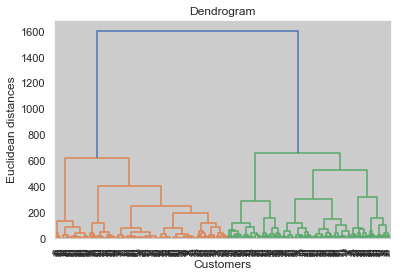

In [162]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [163]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 12, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X)

In [168]:
from clustergram import Clustergram
import urbangrammar_graphics as ugg
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale

sns.set(style='whitegrid')

C:\anaconda\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\anaconda\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


K=1 skipped. Mean computed from data directly.
K=2 fitted in 1.7118284702301025 seconds.
K=3 fitted in 2.3917810916900635 seconds.
K=4 fitted in 2.8218002319335938 seconds.
K=5 fitted in 2.8674237728118896 seconds.
K=6 fitted in 3.0004208087921143 seconds.
K=7 fitted in 3.0039665699005127 seconds.
K=8 fitted in 3.2338595390319824 seconds.
K=9 fitted in 3.432624101638794 seconds.
K=10 fitted in 3.5636534690856934 seconds.
K=11 fitted in 3.549248456954956 seconds.
K=12 fitted in 3.7076094150543213 seconds.


Text(0.5, 1.0, 'K-Means (scikit-learn)')

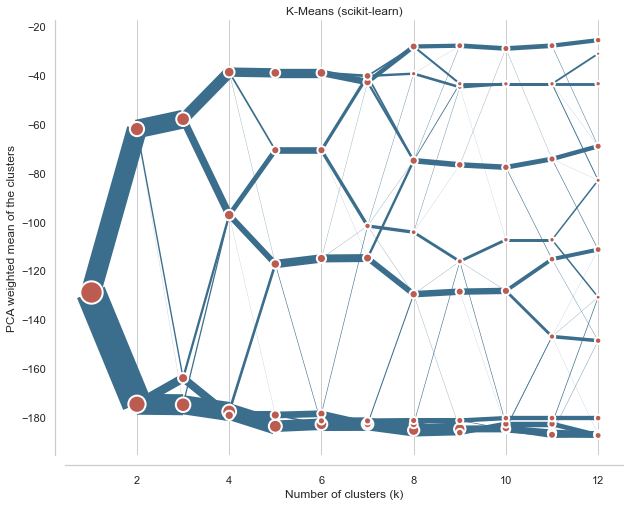

In [170]:
data = X

cgram = Clustergram(range(1, 13), n_init=1000)
cgram.fit(data)

ax = cgram.plot(
    figsize=(10, 8),
    line_style=dict(color=ugg.COLORS[1]),
    cluster_style={"color": ugg.COLORS[2]},
)
ax.yaxis.grid(False)
sns.despine(offset=10)
ax.set_title('K-Means (scikit-learn)')

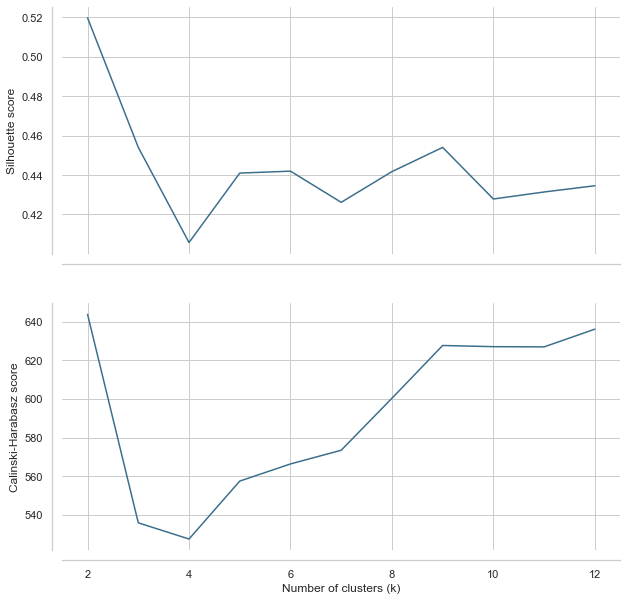

In [171]:
fig, axs = plt.subplots(2, figsize=(10, 10), sharex=True)
cgram.silhouette_score().plot(
    xlabel="Number of clusters (k)",
    ylabel="Silhouette score",
    color=ugg.COLORS[1],
    ax=axs[0],
)
cgram.calinski_harabasz_score().plot(
    xlabel="Number of clusters (k)",
    ylabel="Calinski-Harabasz score",
    color=ugg.COLORS[1],
    ax=axs[1],
)
sns.despine(offset=10)

TypeError: 'KMeans' object is not subscriptable

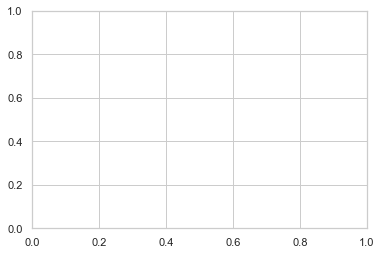

In [172]:
fig = plt.figure()
ax = fig.add_subplot(111)
scatter = ax.scatter(df2['namecompany'],df2['topic'],
                     c=kmeans[0],s=50)
ax.scatter(centroids[:,0],centroids[:,1], color='red', s=120)  
ax.set_title('K-Means Clustering')
ax.set_xlabel('GDP per Capita')
ax.set_ylabel('Corruption')
plt.colorbar(scatter)

In [164]:
plt.scatter(X[y_hc == 0, 0], X[y_hc == 0, 1], s = 100, c = 'red', label = 'Лепестки с длиной от 5 до 7 см с шириной от 1.2 до 2.5 см')
plt.scatter(X[y_hc == 1, 0], X[y_hc == 1, 1], s = 100, c = 'blue', label = 'Лепестки с длиной от 1 до 2 см с шириной от 0.1 до 0.5 см')
plt.scatter(X[y_hc == 2, 0], X[y_hc == 2, 1], s = 100, c = 'green', label = 'Лепестки с длиной от 3 до 5 см с шириной от 1 до 1.5 см')
plt.title('Clusters of petal')
plt.xlabel('petal length (cm)')
plt.ylabel('petal width (cm)')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

InvalidIndexError: (array([False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False,  True, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False,  True, False,
       False,  True, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False,  True,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False]), 0)

## 2.3 Кластеризация

In [91]:
topics = df['topic'].unique()
news_in_cat_count = 400

In [92]:
df_res2 = pd.DataFrame()

for topic in tqdm(topics):
    df_topic = df[df['topic'] == topic][:news_in_cat_count]
    df_res2 = df_res2.append(df_topic, ignore_index=True)

  0%|          | 0/189 [00:00<?, ?it/s]

C:\Users\Роман\AppData\Local\Temp\ipykernel_11216\1942310646.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res2 = df_res2.append(df_topic, ignore_index=True)


In [93]:
texts = df_res2['text_lemm']
type(texts)

pandas.core.series.Series

In [94]:
%%time
tfidf_matrix = tfidf_vectorizer.fit_transform(texts)

CPU times: total: 1.84 s
Wall time: 1.87 s


In [95]:
type(tfidf_matrix)
tfidf_matrix

<438x12465 sparse matrix of type '<class 'numpy.float64'>'
	with 242935 stored elements in Compressed Sparse Row format>

In [96]:
print(tfidf_matrix.shape)

(438, 12465)


In [97]:
tfidf_matrix[:10]

<10x12465 sparse matrix of type '<class 'numpy.float64'>'
	with 5318 stored elements in Compressed Sparse Row format>

In [98]:
num_clusters = 5

# Метод к-средних - KMeans
from sklearn.cluster import KMeans
km = KMeans(n_clusters=num_clusters)

In [99]:
%%time
km.fit(tfidf_matrix)

CPU times: total: 2.12 s
Wall time: 402 ms


KMeans(n_clusters=5)

In [100]:
%%time
idx = km.fit(tfidf_matrix)
clusters = km.labels_.tolist()

CPU times: total: 2.11 s
Wall time: 389 ms


In [101]:
len(km.labels_)
clusters[:10]

[3, 4, 4, 1, 4, 2, 3, 4, 4, 4]

In [102]:
clusterkm = km.labels_.tolist()
frame = pd.DataFrame(texts)

#k-means
out = { 'text': texts, 'cluster': clusterkm, 'topic': df_res2['topic'] }
frame1 = pd.DataFrame(out, columns = ['text', 'cluster', 'topic'])

In [103]:
frame1.head(10)

,text,cluster,topic
0,свой блог рассматривать устройство назначение ...,3,объект
1,решать устраивать самопроверка проводить аудит...,4,объект
2,автор статья роман козловруководитель курс bi ...,4,технологический
3,рынок биологически активный добавка бад каждый...,1,обновление
4,автор статья александр колесниковвирусный анал...,4,ёмкость мач
5,привет звать артем пузанок devsecops инженер д...,2,ёмкость мач
6,исследователь техасский университет сан антони...,3,ёмкость мач
7,часть изображение сгенерировать модель rudall ...,4,ёмкость мач
8,статистика uptime institute год здание цод зар...,4,ёмкость мач
9,представлять совершенно отдыхать свой маленьки...,4,ёмкость мач


In [104]:
fp = frame1[ frame1.topic.eq('ёмкость мач') & frame1.cluster.eq(2) ]
print(len(fp))

43


In [105]:
ser = df[ df['topic'] == 'ёмкость мач']['text_lemm']

In [106]:
print(topics)
print(num_clusters)

['объект' 'технологический' 'обновление' 'ёмкость мач' 'тест' 'сайт'
 'игрок' 'сервис' 'связь' 'лицо' 'команда' 'сертификат' 'бизнеслогика'
 'курс' 'поддержка' 'уведомление' 'разработчик' 'данные' 'инструмент'
 'система' 'схема' 'фильтр' 'ревить' 'обратный' 'инструмент итог' 'вопрос'
 'сервер' 'устанавливать уровень' 'устройство' 'язык' 'сборка' 'контекст'
 'игра' 'японский' 'документация' 'релиз' 'модель' 'зуб'
 'должный применяться' 'чип' 'код' 'кривая' 'библиотека' 'распределение'
 'инцидент' 'рис' 'книга' 'доклад' 'проекция' 'меню'
 'финансовый банковский' 'параметр' 'файл' 'патент' 'тестирование'
 'хотеть' 'год' 'способ собирать' 'идея' 'вебинтерфейс' 'очередь'
 'приложение' 'буфер' 'сотрудник' 'зарплата' 'фильм' 'интервью' 'версия'
 'измерение' 'форма' 'изображение' 'запрос' 'продукт' 'проход' 'бизнес'
 'купить новый' 'стиль' 'вариант' 'новый' 'событие' 'функция' 'кабель'
 'метод' 'мочь' 'смартфон' 'пакет' 'робот' 'компания' 'коннектор'
 'использовать' 'уязвимость' 'прототип' 'шт

In [107]:
for topic in topics:
    print(topic, end = ' \t\t ')
    for cluster in range(num_clusters):
        print(cluster, ' : ', len(frame1[ frame1.topic.eq(topic) &  frame1.cluster.eq(cluster) ]), end = ' ')
    print()

объект 		 0  :  0 1  :  0 2  :  0 3  :  1 4  :  1 
технологический 		 0  :  0 1  :  0 2  :  0 3  :  0 4  :  1 
обновление 		 0  :  0 1  :  1 2  :  0 3  :  0 4  :  0 
ёмкость мач 		 0  :  22 1  :  21 2  :  43 3  :  14 4  :  53 
тест 		 0  :  0 1  :  0 2  :  1 3  :  1 4  :  1 
сайт 		 0  :  1 1  :  0 2  :  0 3  :  0 4  :  0 
игрок 		 0  :  0 1  :  0 2  :  0 3  :  0 4  :  1 
сервис 		 0  :  0 1  :  0 2  :  1 3  :  0 4  :  0 
связь 		 0  :  2 1  :  0 2  :  0 3  :  0 4  :  0 
лицо 		 0  :  0 1  :  0 2  :  1 3  :  0 4  :  1 
команда 		 0  :  1 1  :  1 2  :  1 3  :  1 4  :  2 
сертификат 		 0  :  1 1  :  0 2  :  0 3  :  1 4  :  0 
бизнеслогика 		 0  :  0 1  :  0 2  :  0 3  :  0 4  :  1 
курс 		 0  :  1 1  :  0 2  :  1 3  :  0 4  :  1 
поддержка 		 0  :  0 1  :  0 2  :  1 3  :  0 4  :  0 
уведомление 		 0  :  0 1  :  0 2  :  1 3  :  0 4  :  0 
разработчик 		 0  :  0 1  :  0 2  :  1 3  :  1 4  :  0 
данные 		 0  :  0 1  :  1 2  :  1 3  :  2 4  :  1 
инструмент 		 0  :  0 1  :  0 2  :  0 3  :  0

In [108]:
clust_res = pd.DataFrame(columns=['topic', 'cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4'])
i = 0
for topic in topics:
    cnt = []
    for cluster in range(num_clusters):
        cnt.append(len(frame1[ frame1.topic.eq(topic) &  frame1.cluster.eq(cluster) ]))
    clust_res.loc[i] = [topic] + cnt
    i += 1
clust_res

,topic,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4
0,объект,0,0,0,1,1
1,технологический,0,0,0,0,1
2,обновление,0,1,0,0,0
3,ёмкость мач,22,21,43,14,53
4,тест,0,0,1,1,1
...,...,...,...,...,...,...
184,терминал,0,0,0,1,0
185,рисунок использование,0,0,0,0,1
186,запись,0,0,0,0,1
187,аккумулятор,0,0,0,0,1


In [109]:
from sklearn.preprocessing import LabelEncoder

In [110]:
le1 = LabelEncoder()
clust_res["topic"] = le1.fit_transform(clust_res["topic"].astype('str'))

In [111]:
le1.classes_

array(['абонент', 'автор', 'адрес', 'аккумулятор', 'атака', 'банк',
       'библиотека', 'бизнес', 'бизнеслогика', 'биометрический',
       'блокировка', 'бот', 'браузер', 'буфер', 'вариант', 'вебинтерфейс',
       'версия', 'вопрос', 'вредонос', 'время',
       'встраивать система получить', 'выбор нужно', 'генерация', 'год',
       'головоломка', 'гриб', 'данные', 'данные создать', 'датчик',
       'делать', 'диалог', 'дизайнер', 'дискета', 'доклад',
       'документация', 'должный применяться', 'дом', 'домен', 'драйвер',
       'друг', 'животное', 'задача', 'заказчик', 'запись', 'запрос',
       'зарплата', 'значение', 'зуб', 'игра', 'игрок', 'идея',
       'измерение', 'изображение', 'индекс', 'инструмент',
       'инструмент итог', 'интеллект', 'интервью', 'инцидент',
       'использовать', 'использовать чтоть', 'кабель', 'канал',
       'кандидат', 'качество', 'книга', 'код', 'код решение', 'команда',
       'компания', 'компьютер', 'коннектор', 'контейнер', 'контекст',
       'к

In [112]:
clust_res

,topic,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4
0,93,0,0,0,1,1
1,162,0,0,0,0,1
2,91,0,1,0,0,0
3,188,22,21,43,14,53
4,160,0,0,1,1,1
...,...,...,...,...,...,...
184,159,0,0,0,1,0
185,131,0,0,0,0,1
186,43,0,0,0,0,1
187,3,0,0,0,0,1


In [113]:
from clustergram import Clustergram
import urbangrammar_graphics as ugg
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale

sns.set(style='whitegrid')

C:\anaconda\lib\site-packages\seaborn\rcmod.py:82: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\anaconda\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\anaconda\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\anaconda\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


In [114]:
import matplotlib.pyplot as plt


### Меры сходства 

In [241]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity
 
# зададим массив текстов
some_texts = [
   'файл',
   'otus cloud',
    "Timeweb Cloud",
    'otu',
   'ДОМ.РФ OTUS',
]
df2 = pd.DataFrame({'texts': some_texts})

In [242]:
find_nearest_to = "файл"

In [243]:
tfidf = TfidfVectorizer()
mx_tf = tfidf.fit_transform(some_texts)
new_entry = tfidf.transform([find_nearest_to])

In [244]:
sdf = pd.DataFrame.sparse.from_spmatrix(mx_tf)
sdf

,0,1,2,3,4,5,6
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.0
1,0.707107,0.0,0.707107,0.000000,0.000000,0.000000,0.0
2,0.627914,0.0,0.000000,0.778283,0.000000,0.000000,0.0
3,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.0
4,0.000000,0.0,0.495524,0.000000,0.614189,0.614189,0.0


In [245]:
cosine_similarity(mx_tf)

array([[1.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 1.        , 0.44400208, 0.        , 0.35038823],
       [0.        , 0.44400208, 1.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.35038823, 0.        , 0.        , 1.        ]])

In [246]:
new_entry = tfidf.transform([find_nearest_to])
pd.DataFrame.sparse.from_spmatrix(new_entry)

,0,1,2,3,4,5,6
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [247]:
cosine_similarities = cosine_similarity(new_entry, mx_tf).flatten()
cosine_similarities

array([1., 0., 0., 0., 0.])

In [248]:
# запишем все попарные результаты сравнений
df2['cos_similarities'] = cosine_similarities
# и отсортируем по убыванию (т.к. cos(0)=1)
df2 = df2.sort_values(by=['cos_similarities'], ascending=[0])
df2

,texts,cos_similarities
0,файл,1.0
1,otus cloud,0.0
2,Timeweb Cloud,0.0
3,otu,0.0
4,ДОМ.РФ OTUS,0.0


In [249]:
linear_kernel(mx_tf)

array([[1.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 1.        , 0.44400208, 0.        , 0.35038823],
       [0.        , 0.44400208, 1.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.35038823, 0.        , 0.        , 1.        ]])

In [250]:
new_entry = tfidf.transform([find_nearest_to])
pd.DataFrame.sparse.from_spmatrix(new_entry)

,0,1,2,3,4,5,6
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [251]:
linear_kernel = linear_kernel(new_entry, mx_tf).flatten()
linear_kernel

array([1., 0., 0., 0., 0.])

In [252]:

df2['linear_kernel'] = linear_kernel

df2 = df2.sort_values(by=['linear_kernel'], ascending=[0])
df2

,texts,cos_similarities,linear_kernel
0,файл,1.0,1.0
1,otus cloud,0.0,0.0
2,Timeweb Cloud,0.0,0.0
3,otu,0.0,0.0
4,ДОМ.РФ OTUS,0.0,0.0


## 3.1 Разбиение выборки

In [272]:
X = df['text_lemm']

y = df['topic']

In [273]:
type(df['text_lemm'][0])

str

In [274]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [275]:
my_tags = df['topic'].unique()
my_tags = my_tags[:-119]
my_tags

array(['файл', 'редактор', 'сообщение', 'устройство', 'трейс', 'запрос',
       'ёмкость мач', 'статья', 'подключаться компьютер', 'светодиод',
       'новый', 'крахмал', 'тест', 'аккумулятор', 'блокировка', 'буфер',
       'документация', 'шаблон', 'кластер', 'модель', 'значение',
       'критерий', 'сборка', 'автомобиль', 'индикатор', 'распределение',
       'очередь', 'сервер', 'адрес', 'пакет', 'кнопка', 'картинка',
       'система', 'нужно', 'зуб', 'датчик', 'компонент', 'контейнер',
       'связь', 'расчёт', 'согласованность', 'время', 'драйвер',
       'аккаунт', 'скорость', 'кабель', 'данные', 'общий инструмент',
       'тип человек', 'объект', 'канал', 'курс', 'идея', 'текст',
       'приложение', 'доклад', 'самолёт', 'журнал', 'состояние',
       'сотрудник', 'компания', 'уязвимость', 'автоматизировать помощь',
       'меню', 'диск', 'синтаксис', 'дебаты', 'рассмотреть инструмент',
       'бизнес', 'унифицировать', 'ресурс', 'процессор', 'модуль', 'год',
       'сессия', 'ком

In [276]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer

In [277]:
nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])

In [263]:
%%time
nb.fit(X_train, y_train)

CPU times: total: 328 ms
Wall time: 352 ms


Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', MultinomialNB())])

In [264]:
%%time
from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

CPU times: total: 109 ms
Wall time: 108 ms


In [265]:
y_test[0]

'файл'

In [266]:
print(X_test[0], y_test[0], y_pred[0])

свой блог рассматривать устройство назначение контроллер norvi обходить внимание оказываться контроллер линейка gsm иметь соответствующий модуль свой борт понимать наличие gsm модуль являться существенный дополнение значительно расширять возможность контроллер посылать принимать информационный управляющий sms организовывать резервный независимый ваш iot инфраструктура канал связь статья рассматривать модель norvi gsm ae v который кроме esp gsm модуль содержать цифровой аналоговый вход интерфейс rs прочий возможность делать контроллер интересный решение создание ваш проект автоматизация  ❯ семейство norvi gsmконтроллеры линейка norvi gsm иметь качество ядро модуль esp wroom wi fi bluetooth мб eeprom позволять решать довольно тяжелый вычислительный задача поддерживать беспроводный связь полноценный веб интерфейс работать шифрование данный большинство модель контроллер линейка иметь gsm модуль дисплей кнопка управление передний панель корпус межблочный интерфейс цифровой опторазвязывать в

In [267]:
from sklearn.metrics import accuracy_score

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred, target_names=my_tags))

accuracy 0.25757575757575757


ValueError: Number of classes, 83, does not match size of target_names, 205. Try specifying the labels parameter

In [278]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])

In [279]:
%%time
logreg.fit(X_train, y_train)

CPU times: total: 5min 15s
Wall time: 1min 2s


C:\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(C=100000.0, n_jobs=1))])

In [280]:
%%time
y_pred = logreg.predict(X_test)

CPU times: total: 109 ms
Wall time: 110 ms


In [281]:
print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=my_tags))

accuracy 0.25
                         precision    recall  f1-score   support

                   файл       0.00      0.00      0.00         1
               редактор       0.00      0.00      0.00         1
              сообщение       0.00      0.00      0.00         2
             устройство       0.00      0.00      0.00         1
                  трейс       0.00      0.00      0.00         1
                 запрос       0.00      0.00      0.00         1
            ёмкость мач       0.00      0.00      0.00         1
                 статья       0.00      0.00      0.00         1
 подключаться компьютер       0.00      0.00      0.00         1
              светодиод       0.00      0.00      0.00         1
                  новый       0.00      0.00      0.00         3
                крахмал       0.00      0.00      0.00         1
                   тест       0.00      0.00      0.00         1
            аккумулятор       0.00      0.00      0.00         1
          

C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall 

In [282]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])

In [283]:
%%time
sgd.fit(X_train, y_train)

CPU times: total: 1.47 s
Wall time: 477 ms


Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf',
                 SGDClassifier(alpha=0.001, max_iter=5, random_state=42,
                               tol=None))])

In [284]:
%%time
y_pred = sgd.predict(X_test)

CPU times: total: 109 ms
Wall time: 107 ms


In [285]:
print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=my_tags))

accuracy 0.22727272727272727


ValueError: Number of classes, 94, does not match size of target_names, 86. Try specifying the labels parameter

### Проверка

In [296]:
econ_text = '''
фывщцьвзщйьзщьцйщзьц
'''

In [297]:
econ_text = remove_multiple_spaces(remove_numbers(remove_punctuation(econ_text.lower())))
econ_text = remove_stop_words(econ_text)

In [298]:
%%time
econ_text = lemmatize_text(econ_text)

CPU times: total: 0 ns
Wall time: 677 ms


In [299]:
econ_text

'фывщцьвзщйьзщьцйщзьц \n'

In [300]:
ect_pred = logreg.predict([econ_text])
ect_pred

array(['ёмкость мач'], dtype=object)